<a href="https://colab.research.google.com/github/fcastellanosp/MINE-4210_202420_ADL/blob/main/Laboratorios/Laboratorio%201/MINE4210_ADL_2024_Lab1_S1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

![Logo ADL](https://github.com/fcastellanosp/MINE-4210_202420_ADL/blob/main/Laboratorios/logo_adl.png?raw=true)


# **Laboratorio 1 - Sesión 1**
## **Introducción a Keras y Tensorflow**

## **Tabla de Contenido**

[Contexto y objetivos.](#scrollTo=uGH410ZnYILV&line=13&uniqifier=1)<br>
[0. Importación de librerías.](#scrollTo=y1pFEFR1_-2V&line=1&uniqifier=1)<br>
[1. Entendimiento de los datos.](#scrollTo=9O1de2GRA1f2&line=1&uniqifier=1)<br>
[2. Preparación.](#scrollTo=8ADZzDfHCUQ5&line=1&uniqifier=1)<br>
[3. Modelamiento.](#scrollTo=LiL9RIh1EXe7&line=1&uniqifier=1)<br>
[4. Evaluación.](#scrollTo=NxWp2JgslY1x&line=1&uniqifier=1)<br>
[5. Hands on.](#scrollTo=UmLFsb4RhCfM&line=1&uniqifier=1)<br>




**Tutores**
- Fabián Camilo Castellanos.
- Nicolás Tibatá Castañeda.

## Contexto y objetivos

**Problema**
- En este problema se busca analizar el Price Range que puede llegar a tener un celular dadas sus características.

**Objetivos**
1. Introducción al uso de Tensorflow y Keras
2. Entrenamiento de una red neuronal de una sola capa oculta.

**Datos**

Los datos los puedes consultar [aquí](https://www.kaggle.com/datasets/mbsoroush/mobile-price-range/data?select=train.csv).

## 0. Importación de librerías

Las librerías que se van a utilizar, se tienen que instalar desde consola para que se encuentren dentro del ambiente donde se está ejecutando el Notebook. Sin embargo, si se encuentran en un ambiente compartido como Google Colab o simplemente desean realizar la instalación de los paquetes desde el mismo notebook lo pueden hacer con el siguiente código

```
!pip install [nom_paquete]
```

Por ejemplo:
```
!pip install pandas
```



In [ ]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip -q
!pip install keras-tuner -q
!pip install kaggle -q
!pip install scikeras -q
# El '-q' hace referencia a 'quiet'. Por lo tanto el output de los paquetes no se muestra completo

     - 17.8 MB 21.6 MB/s 0:00:01
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 17.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 23.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.1/129.1 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.4/13.4 MB 63.7 MB/s eta 0:00:00


Para este ejercicio, utilizaremos las siguientes librerías.

In [ ]:
import numpy as np
import pandas as pd
from google.colab import files

from pandas_profiling import ProfileReport
from numpy import sqrt

import matplotlib.pyplot as plt
plt.style.use("seaborn-deep")
import seaborn as sns

import tensorflow as tf

from keras.models import Sequential
from keras.layers import Dense, Input
from keras.utils import plot_model
import keras_tuner as kt

from scikeras.wrappers import KerasClassifier

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler, LabelEncoder, FunctionTransformer
from sklearn.metrics import mean_squared_error, mean_absolute_error, confusion_matrix, classification_report

<ipython-input-2-55e46eb7280f>:5: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport
<ipython-input-2-55e46eb7280f>:9: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use("seaborn-deep")


## 1. Entendimiento de los datos

Hoy en día el celular deja de ser un lujo y se convierte en una necesidad para nuestro dia a dia, ya que nos permite mantenernos conectados, organizados y productivos en todo momento. Desde gestionar nuestras tareas diarias hasta acceder a información en tiempo real, el celular se ha convertido en una herramienta indispensable.

Es de interés conocer el rango de precios de un celular dada sus características más significativas, pues así podemos tomar mejores decisiones.

El negocio nos ha bridado el siguiente diccionario de datos:

| Columna | Descripción |
| --- | --- |
| battery_power |  Total de energía que puede ser almacenada en una sola carga (mAh).|
| blue |  Si tiene bluetooth o no.|
| clock_speed |  Velocidad en la que el microprocesador ejecuta acciones.|
| dual_sim | Si soporta dual sim o no.|
| fc | Cámara frontal (Megapixeles).|
| four_g |  Si soporta 4G o no.|
| int_memory |  Memoria interna (Gigabytes). |
| m_dep |  Profundidad del dispositivo (cm).
| mobile_wt | Peso del celular.|
| pc |  Camara Principal (Megapixeles).|
| px_height |  Altura de la resolución.|
| px_width | Ancho de la resolución.|
| ram |  Memoria Ram (Megabytes).|
| sc_h |  Altura de la pantalla del movil (cm).|
| sc_w |  Ancho de la pantalla del movil (cm).|
| talk_time | Mayor tiempo de autonomía con una sola carga de batería.|
| three_g |  Si soporta 3G o no.|
| touch_screen |  Si tiene pantalla tactil o no.|
| wifi |  Si soporta wifi o no.|
| n_cores | Número de cores en el procesador.|
| price_range | (Target) Rango de precios; 0 (low cost), 1 (medium cost), 2 (high cost), 3(very high cost).|



En este caso se realiza el cargue directamente de kaggle, [aquí](https://www.kaggle.com/discussions/general/74235) puedes consultar el paso a paso.

In [ ]:
files.upload() # Cargamos el Kaggle.json (API)

!rm -r ~/.kaggle
!mkdir ~/.kaggle
!mv ./kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets list #Correr este comando verifica que está bien montado el driver de kaggle

Saving kaggle.json to kaggle.json
rm: cannot remove '/root/.kaggle': No such file or directory
ref                                                             title                                               size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  -------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
muhammadehsan000/healthcare-dataset-2019-2024                   Healthcare Dataset (2019-2024)                       3MB  2024-08-09 17:52:25           2043         43  1.0              
muhammadehsan000/global-electric-vehicle-sales-data-2010-2024   Global Electric Vehicle Sales Data (2010-2024)      83KB  2024-08-09 16:39:22           1605         27  1.0              
myrios/cost-of-living-index-by-country-by-number-2024           Cost of Living Index by Country                      3KB  2024-07-19 06:25:42           4570 

In [ ]:
!kaggle datasets download mbsoroush/mobile-price-range

Dataset URL: https://www.kaggle.com/datasets/mbsoroush/mobile-price-range
License(s): other
  0% 0.00/70.6k [00:00<?, ?B/s]
100% 70.6k/70.6k [00:00<00:00, 33.6MB/s]


In [ ]:
ROOT_DIR = '/content'
DATASET_NAME = 'mobile-price-range'

%cd {ROOT_DIR}
!unzip {DATASET_NAME}.zip -d {ROOT_DIR}/{DATASET_NAME}

/content
Archive:  mobile-price-range.zip
  inflating: /content/mobile-price-range/test.csv  
  inflating: /content/mobile-price-range/train.csv  


In [ ]:
df = pd.read_csv(f'{ROOT_DIR}/{DATASET_NAME}/train.csv')
df_train, df_test = train_test_split(df, test_size=0.2 , random_state=33)

In [ ]:
df_train

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
368,1864,0,1.4,0,8,1,46,0.7,178,1,...,168,981,2686,11,7,18,1,1,1,2
294,832,0,1.6,1,1,1,34,0.3,108,5,...,311,1294,447,15,13,12,1,1,0,0
515,1832,0,0.7,0,2,0,2,0.6,90,7,...,186,654,2978,18,7,18,0,0,0,2
1840,1564,0,1.5,1,1,0,42,0.7,108,2,...,1619,1962,3376,7,0,7,0,1,0,3
1561,1076,0,2.3,1,0,1,14,0.7,191,5,...,1088,1718,2355,17,16,2,1,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
658,1926,1,1.1,0,13,1,50,0.2,179,6,...,371,1000,3809,17,12,17,1,1,0,3
578,1195,0,2.0,1,1,1,23,0.1,82,4,...,163,1100,980,13,9,17,1,0,0,0
1752,1938,1,0.5,1,5,0,44,0.5,121,2,...,1299,1935,3497,18,10,18,0,1,0,3
391,1036,1,2.4,0,0,0,39,0.2,119,7,...,373,926,2101,10,7,2,0,1,0,1


In [ ]:
df_test

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
766,1872,1,0.9,1,0,0,16,0.5,80,2,...,286,1484,2295,15,11,16,0,0,1,2
182,1082,0,0.8,0,0,0,38,0.1,198,8,...,986,1191,2337,6,1,17,0,1,1,2
1763,994,0,1.2,1,4,0,40,0.9,164,2,...,296,839,3104,17,7,11,0,0,0,2
1814,713,0,1.6,0,4,1,63,0.7,89,2,...,103,1760,2082,15,10,12,1,0,0,1
596,1175,0,0.6,0,10,0,25,0.1,145,2,...,137,1501,3153,9,4,12,1,0,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9,509,1,0.6,1,2,1,9,0.1,93,5,...,1137,1224,513,19,10,12,1,0,0,0
1655,1670,1,3.0,0,14,0,62,0.5,114,8,...,1117,1330,3024,6,0,20,0,0,1,3
1544,1330,1,1.8,1,1,0,40,0.5,177,1,...,194,892,2678,9,4,14,1,1,1,2
961,1807,1,0.5,1,2,1,61,0.1,134,6,...,1734,1968,3726,8,5,15,1,0,0,3


In [ ]:
#Veremos la información general del dataframe: total de registros, saber si existen columna con datos nulos así como los tipos de datos
print(df_train.info())
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
Index: 1600 entries, 368 to 1044
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  1600 non-null   int64  
 1   blue           1600 non-null   int64  
 2   clock_speed    1600 non-null   float64
 3   dual_sim       1600 non-null   int64  
 4   fc             1600 non-null   int64  
 5   four_g         1600 non-null   int64  
 6   int_memory     1600 non-null   int64  
 7   m_dep          1600 non-null   float64
 8   mobile_wt      1600 non-null   int64  
 9   n_cores        1600 non-null   int64  
 10  pc             1600 non-null   int64  
 11  px_height      1600 non-null   int64  
 12  px_width       1600 non-null   int64  
 13  ram            1600 non-null   int64  
 14  sc_h           1600 non-null   int64  
 15  sc_w           1600 non-null   int64  
 16  talk_time      1600 non-null   int64  
 17  three_g        1600 non-null   int64  
 18  touch_scree

Utilizaremos la libreria de pandas-profiling para realizar una exploración de datos más profunda

In [ ]:
ProfileReport(df_train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 2. Preparación

La preparación de los datos consiste en eliminar registros con ausencias, transformar variables categóricas en numéricas y escalar los datos, si es necesario. Todo esto dependerá no solo del algoritmo a utilizar sino del contexto del negocio. **En este caso solo es necesario hacer un StandardScaler a las variables de entrenamiento**.

Ahora separamos los datos de entrada en X como variables explicativas y la variable a predecir Y en df_train

In [ ]:
# LE = LabelEncoder()
# df_train['price_range'] = LE.fit_transform(df_train['price_range'])
# Es necesario LabelEncoder?

X_train, y_train = df_train.drop(['price_range'], axis=1), df_train['price_range']
display(X_train.head())
y_train.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
368,1864,0,1.4,0,8,1,46,0.7,178,1,12,168,981,2686,11,7,18,1,1,1
294,832,0,1.6,1,1,1,34,0.3,108,5,5,311,1294,447,15,13,12,1,1,0
515,1832,0,0.7,0,2,0,2,0.6,90,7,6,186,654,2978,18,7,18,0,0,0
1840,1564,0,1.5,1,1,0,42,0.7,108,2,2,1619,1962,3376,7,0,7,0,1,0
1561,1076,0,2.3,1,0,1,14,0.7,191,5,0,1088,1718,2355,17,16,2,1,1,1


,price_range
368,2
294,0
515,2
1840,3
1561,2


Adicionalmente, normalizaremos los datos.

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
display(pd.DataFrame(X_train_scaled, columns=X_train.columns))

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1.391849,-0.982650,-0.157963,-1.020204,0.866100,0.952382,0.765701,0.675425,1.078880,-1.546147,0.349795,-1.087459,-0.622773,0.509052,-0.308071,0.279997,1.254333,0.549428,0.996257,0.988813
1,-0.966203,-0.982650,0.086941,0.980196,-0.768877,0.952382,0.108329,-0.714517,-0.903282,0.200295,-0.815149,-0.768293,0.099781,-1.571196,0.642124,1.652110,0.157249,0.549428,0.996257,-1.011314
2,1.318731,-0.982650,-1.015129,-1.020204,-0.535309,-1.049998,-1.644662,0.327939,-1.412980,1.073516,-0.648729,-1.047285,-1.377646,0.780349,1.354771,0.279997,1.254333,-1.820074,-1.003757,-1.011314
3,0.706369,-0.982650,-0.035511,0.980196,-0.768877,-1.049998,0.546577,0.675425,-0.903282,-1.109536,-1.314411,2.151076,1.641846,1.150129,-1.258267,-1.320802,-0.756988,-1.820074,0.996257,-1.011314
4,-0.408679,-0.982650,0.944107,0.980196,-1.002445,0.952382,-0.987290,0.675425,1.446996,0.200295,-1.647253,0.965920,1.078577,0.201521,1.117222,2.338167,-1.671226,0.549428,0.996257,0.988813
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,1.533515,1.017656,-0.525320,-1.020204,2.033941,0.952382,0.984825,-1.062003,1.107196,0.636906,1.181899,-0.634377,-0.578912,1.552428,1.117222,1.423424,1.071486,0.549428,0.996257,-1.011314
1596,-0.136772,-0.982650,0.576750,0.980196,-0.768877,0.952382,-0.494262,-1.409488,-1.639513,-0.236315,-0.149467,-1.098619,-0.348064,-1.075987,0.167027,0.737368,1.071486,0.549428,-1.003757,-1.011314
1597,1.560934,1.017656,-1.260033,0.980196,0.165395,-1.049998,0.656139,-0.019546,-0.535166,-1.109536,-0.149467,1.436858,1.579517,1.262550,1.354771,0.966053,1.254333,-1.820074,0.996257,-1.011314
1598,-0.500076,1.017656,1.066559,-1.020204,-1.002445,-1.049998,0.382234,-1.062003,-0.591799,1.073516,-1.147991,-0.629913,-0.749740,-0.034469,-0.545620,0.279997,-1.671226,-1.820074,0.996257,-1.011314


## 3. Modelamiento

Vamos a utilizar la arquitectura de un Perceptron de una sola capa, la cual se ve de la siguiente manera:

![Multilayer Perceptron](https://github.com/jcestevezc/Machine-Learning-Techniques/blob/master/Laboratorio%205/MLP.png?raw=true)

Para ello, lo primero que definiremos, será nuestro modelo.

La libreria Keras nos permite crear modelos secuenciales mediante la clase **Sequential**, primero definimos el modelo y le asignamos un nombre, seguido se usa el método **add** para ir adicionando las capas que vamos requiriendo.

La primera capa, que corresponde a la capa de entrada (tipo Input), se debe especificar con el número de neuronas que corresponde al número de características que vamos a tener en nuestro modelo, en este caso nuestros datos en X contienen 20 columnas o características, por ende se requieren sea de 20. Una forma general de definirlo es usando el método shape: X.shape[1]

Seguido a la capa de entrada agregamos una capa de tipo Dense, que será nuestra capa oculta, la cual inicialmente asignaremos 3 neuronas y utilizará la función de activación RELU.

Finalmente, se adiciona la capa de salida (también de tipo Dense pero con función de activación SOFTMAX), que nos dará el resultado de las predicciones de nuestro modelo. En este caso con 4 neuronas, haciendo referencia a las 4 posibles segmentaciones del price_range.


In [ ]:
model = Sequential(name="Mi_primer_MLP")

In [ ]:
model.add(Input(shape=(X_train_scaled.shape[1],), name='Capa_Entrada'))
model.add(Dense(3,activation='relu',name='Capa_Oculta'))
model.add(Dense(4,activation='softmax',name='Capa_Salida'))

El método **compile** permite configurar nuestro modelo para el entrenamiento. Este método acepta varios argumentos, como el *optimizer*, la *loss* y las *metrics*, que se utilizan para optimizar los pesos del modelo durante el entrenamiento.

In [ ]:
model.compile(loss='sparse_categorical_crossentropy',
                optimizer='adam',
                metrics=['accuracy'])

model.summary()

Model: "Mi_primer_MLP"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ Capa_Oculta (Dense)                  │ (None, 3)                   │              63 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ Capa_Salida (Dense)                  │ (None, 4)                   │              16 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 79 (316.00 B)

 Trainable params: 79 (316.00 B)

 Non-trainable params: 0 (0.00 B)

Mostramos nuestro modelo base

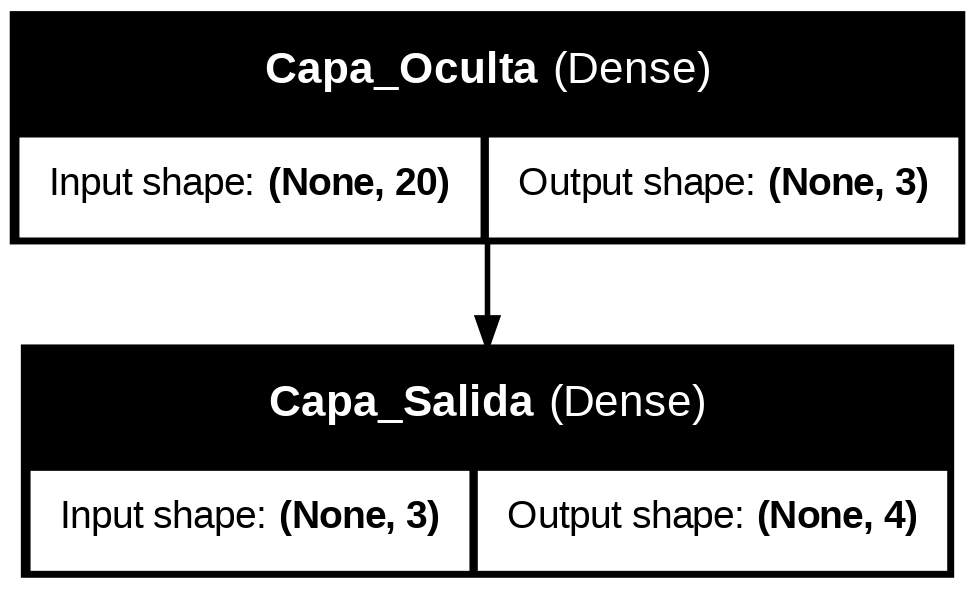

In [ ]:
plot_model(model, show_shapes=True, show_layer_names=True)

Y realizamos el entrenamiento de nuestro modelo, para esto usamos el método fit.

In [ ]:
history = model.fit(
    X_train_scaled,
    y_train,
    batch_size=10,
    epochs=50
)

Epoch 1/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.2241 - loss: 1.5999
Epoch 2/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.2704 - loss: 1.4525
Epoch 3/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.3545 - loss: 1.3522
Epoch 4/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.4186 - loss: 1.2861
Epoch 5/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.4694 - loss: 1.2390
Epoch 6/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 1s 1ms/step - accuracy: 0.5641 - loss: 1.1533
Epoch 7/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.5853 - loss: 1.0756
Epoch 8/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6048 - loss: 0.9972
Epoch 9/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6027 - loss: 0.9426
Epoch 10/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6380 - loss: 0.8601
Epoch 11/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.6722 - loss: 0.8134
Epoch 12/50
160/160 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step

## 4. Evaluación

Para mirar el rendimiento de nuestro modelo, vamos a utilizar nuestros datos de entrenamiento.

In [ ]:
loss, accuracy = model.evaluate(X_train_scaled, y_train)
print(f'Loss: {loss}, Accuracy: {accuracy}')

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.9827 - loss: 0.1110
Loss: 0.11515720188617706, Accuracy: 0.9787499904632568


Realicemos predicciones...

In [ ]:
y_pred = model.predict(X_train_scaled)
y_pred_classes = y_pred.argmax(axis=1) # Por qué Argmax?
y_pred_classes

50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step


array([2, 0, 3, ..., 3, 1, 1])

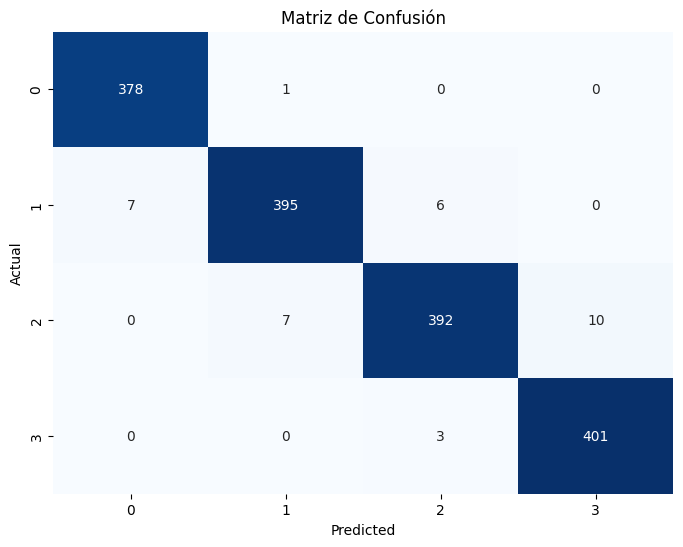

In [ ]:
cm = confusion_matrix(y_train, y_pred_classes)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Matriz de Confusión')
plt.show()

In [ ]:
# Evaluar el modelo
print(classification_report(y_train, y_pred_classes))

              precision    recall  f1-score   support

           0       0.98      1.00      0.99       379
           1       0.98      0.97      0.97       408
           2       0.98      0.96      0.97       409
           3       0.98      0.99      0.98       404

    accuracy                           0.98      1600
   macro avg       0.98      0.98      0.98      1600
weighted avg       0.98      0.98      0.98      1600



Ahora evaluemos con los datos test...

In [ ]:
X_test, y_test = df_test.drop(['price_range'], axis=1), df_test['price_range']
display(X_test.head())
y_test.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
766,1872,1,0.9,1,0,0,16,0.5,80,2,2,286,1484,2295,15,11,16,0,0,1
182,1082,0,0.8,0,0,0,38,0.1,198,8,5,986,1191,2337,6,1,17,0,1,1
1763,994,0,1.2,1,4,0,40,0.9,164,2,17,296,839,3104,17,7,11,0,0,0
1814,713,0,1.6,0,4,1,63,0.7,89,2,8,103,1760,2082,15,10,12,1,0,0
596,1175,0,0.6,0,10,0,25,0.1,145,2,12,137,1501,3153,9,4,12,1,0,0


,price_range
766,2
182,2
1763,2
1814,1
596,2


In [ ]:
X_test_scaled = scaler.transform(X_test)
display(pd.DataFrame(X_test_scaled, columns=X_test.columns))

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi
0,1.410128,1.017656,-0.770225,0.980196,-1.002445,-1.049998,-0.877728,-0.019546,-1.696146,-1.109536,-1.314411,-0.824091,0.538392,0.145775,0.642124,1.194739,0.888639,-1.820074,-1.003757,0.988813
1,-0.394969,-0.982650,-0.892677,-1.020204,-1.002445,-1.049998,0.327453,-1.409488,1.645212,1.510127,-0.815149,0.738262,-0.137992,0.184797,-1.495815,-1.092116,1.071486,-1.820074,0.996257,0.988813
2,-0.596044,-0.982650,-0.402868,0.980196,-0.068173,-1.049998,0.437015,1.370396,0.682448,-1.109536,1.181899,-0.801772,-0.950577,0.897415,1.117222,0.279997,-0.025599,-1.820074,-1.003757,-1.011314
3,-1.238110,-0.982650,0.086941,-1.020204,-0.068173,0.952382,1.696978,0.675425,-1.441297,-1.109536,-0.315887,-1.232535,1.175533,-0.052122,0.642124,0.966053,0.157249,0.549428,-1.003757,-1.011314
4,-0.182471,-0.982650,-1.137581,-1.020204,1.333236,-1.049998,-0.384700,-1.409488,0.144432,-1.109536,0.349795,-1.156649,0.577637,0.942940,-0.783169,-0.406060,0.157249,0.549428,-1.003757,-1.011314
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
395,-1.704237,1.017656,-1.137581,0.980196,-0.535309,0.952382,-1.261195,-1.409488,-1.328031,0.200295,0.849058,1.075284,-0.061812,-1.509875,1.592320,0.966053,0.157249,0.549428,-1.003757,-1.011314
396,0.948572,1.017656,1.801272,-1.020204,2.267509,-1.049998,1.642197,-0.019546,-0.733382,1.510127,1.681161,1.030646,0.182886,0.823087,-1.495815,-1.320802,1.620028,-1.820074,-1.003757,0.988813
397,0.171694,1.017656,0.331846,0.980196,-0.768877,-1.049998,0.437015,-0.019546,1.050563,-1.546147,-0.815149,-1.029429,-0.828228,0.501619,-0.783169,-0.406060,0.522944,0.549428,0.996257,0.988813
398,1.261608,1.017656,-1.260033,0.980196,-0.535309,0.952382,1.587416,-1.409488,-0.167050,0.636906,-0.648729,2.407749,1.655697,1.475313,-1.020718,-0.177374,0.705791,0.549428,-1.003757,-1.011314


In [ ]:
y_pred = model.predict(X_test_scaled)
y_pred_classes = y_pred.argmax(axis=1)
y_pred_classes

13/13 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step 


array([2, 2, 2, 1, 2, 1, 3, 3, 0, 1, 0, 0, 1, 0, 0, 0, 2, 3, 3, 2, 1, 1,
       2, 0, 0, 1, 2, 1, 3, 3, 3, 1, 3, 1, 0, 1, 2, 0, 2, 0, 3, 2, 0, 3,
       0, 2, 2, 1, 1, 2, 2, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 0, 0, 3, 2, 0,
       0, 3, 1, 3, 0, 0, 2, 2, 3, 1, 0, 2, 0, 0, 2, 1, 2, 1, 1, 2, 3, 1,
       1, 0, 1, 0, 0, 2, 2, 3, 0, 3, 3, 3, 0, 2, 2, 0, 3, 0, 1, 2, 2, 0,
       0, 2, 2, 0, 2, 0, 2, 0, 1, 0, 0, 3, 2, 2, 1, 2, 0, 2, 1, 2, 2, 2,
       3, 2, 2, 2, 0, 1, 1, 2, 3, 3, 1, 3, 0, 0, 3, 3, 2, 0, 0, 1, 3, 0,
       0, 3, 1, 3, 1, 1, 1, 2, 2, 1, 3, 3, 0, 3, 0, 0, 1, 3, 3, 3, 0, 2,
       1, 1, 3, 1, 2, 3, 1, 0, 2, 2, 0, 1, 1, 0, 2, 0, 2, 1, 3, 0, 2, 1,
       1, 1, 0, 3, 1, 3, 0, 3, 0, 3, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 3,
       1, 2, 2, 1, 0, 3, 3, 0, 0, 2, 3, 2, 1, 0, 3, 2, 0, 2, 2, 3, 3, 3,
       0, 0, 2, 0, 0, 0, 0, 0, 3, 3, 0, 2, 0, 0, 1, 0, 1, 1, 0, 0, 2, 2,
       0, 0, 3, 0, 3, 3, 3, 0, 2, 3, 1, 1, 3, 3, 1, 0, 0, 0, 3, 1, 2, 1,
       0, 2, 1, 3, 0, 3, 3, 1, 0, 1, 0, 3, 2, 2, 1,

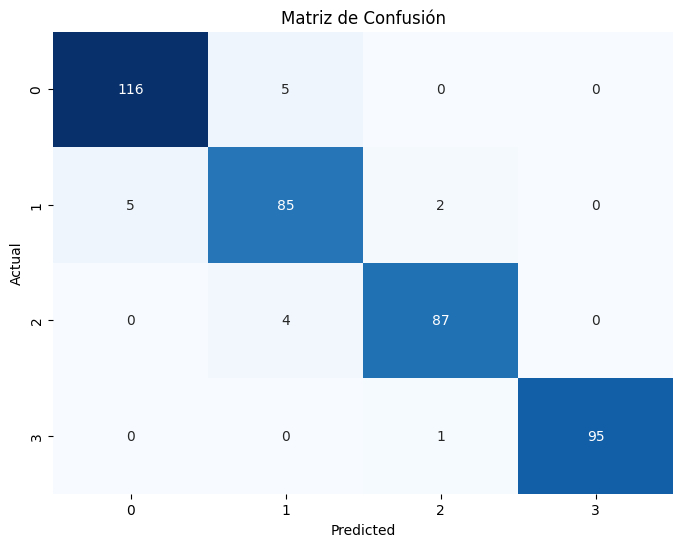

In [ ]:
cm = confusion_matrix(y_test, y_pred_classes)

# Visualizar la matriz de confusión
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Matriz de Confusión')
plt.show()

In [ ]:
# Evaluar el modelo
print(classification_report(y_test, y_pred_classes))

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       121
           1       0.90      0.92      0.91        92
           2       0.97      0.96      0.96        91
           3       1.00      0.99      0.99        96

    accuracy                           0.96       400
   macro avg       0.96      0.96      0.96       400
weighted avg       0.96      0.96      0.96       400



## 5. Hands on


1. ¿Que pasa si aumentamos el número de neuronas en la capa oculta? ¿O si cambiamos la función de activación de la capa de salida?

2.  ¿Que pasa si usamos `X_train` y no `X_train_scaled` para el entrenamiento? ¿Es más o menos eficiente?

3.  ¿Cómo se puede automatizar el preprocesamiento y la definición de hiperparametros? ¿Es posible?

- Respuesta: